# Integration of scRNA-seq and spatial proteomics data with DiagVI

In this tutorial, we demonstrate how to train DiagVI, a deep generative model for integrating unpaired multi-modal single-cell data using prior biological knowledge encoded in a guidance graph. We focus on the integration of scRNA-seq and spatial proteomics data. DiagVI is designed to align modalities with different feature spaces and sampling biases, making it particularly well suited for this integration task. A common application of DiagVI is the transfer of biological information such as cell type labels from scRNA-seq datasets to spatial proteomics datasets. This scenario frequently arises because scRNA-seq typically profiles thousands of genes but lacks spatial context, whereas spatial proteomics provides high spatial resolution while measuring only a limited number of protein markers.

We illustrate the workflow using a [10x Genomics demo dataset](https://www.10xgenomics.com/datasets/xenium-protein-ffpe-human-renal-carcinoma) profiling a human renal cell carcinoma sample at both the gene and protein level. To simulate a realistic unpaired integration setting, we artificially decouple the gene and protein measurements by treating them as originating from independent cells. Since the original dataset contains paired measurements, we can quantitatively assess integration performance using the FOSCTTM (Fraction of Samples Closer Than the True Match) metric. Additionally, we evaluate the learned latent embeddings using the [scIB-metrics](https://scib-metrics.readthedocs.io/en/stable/) benchmarking framework. Throughout the tutorial, we compare DiagVI to simple PCA- and CCA-based baselines, as well as to [scVI](https://docs.scvi-tools.org/en/stable/user_guide/models/scvi.html) and [scANVI](https://docs.scvi-tools.org/en/stable/user_guide/models/scanvi.html). Finally, we demonstrate how the learned latent representations can be used to transfer cell type labels from scRNA-seq to spatial proteomics data.

Overview of this tutorial:

1. Loading and preprocessing the data
2. Preparing a guidance graph
3. Integrating the data with DiagVI
4. Evaluating the results
5. Transfering cell type labels

```{note}
Running the following cell will install tutorial dependencies on Google Colab and in the currently active environment when running outside of Google Colab.
```

In [1]:
!pip install --quiet scvi-colab
!pip install --quiet cellmapper
from scvi_colab import install

install()


[notice] A new release of pip is available: 24.3.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip


/opt/anaconda3/envs/scvi_new/lib/python3.13/site-packages/scvi_colab/_core.py:42: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import ContextualVersionConflict
/opt/anaconda3/envs/scvi_new/lib/python3.13/site-packages/scvi_colab/_core.py:47: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


```{note}
Due to the large size of the dataset used in this tutorial, we rely on `rapids_singlecell` to ensure that computationally intensive analysis steps run in a reasonable amount of time. Without GPU acceleration, steps such as neighborhood graph construction would be very slow. Importantly, DiagVI itself does not depend on `rapids_singlecell`.
```

In [2]:
import os
import tempfile
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as sp
import scvi
import scviva
from cellmapper import CellMapper
from scib_metrics.benchmark import BatchCorrection, Benchmarker, BioConservation
from scviva.external.diagvi import DIAGVI; from scvi.external import cytovi
from scviva.external.diagvi._utils import compute_foscttm

try:
    import rapids_singlecell as rsc

    HAS_RSC = True
except ImportError:
    HAS_RSC = False

/opt/anaconda3/envs/scvi_new/lib/python3.13/site-packages/rapids_singlecell/__init__.py:38: UserWarning: 
Multiple rapids_singlecell packages are installed: rapids-singlecell, rapids-singlecell-cu13
Please uninstall all versions and reinstall only one:
  pip uninstall rapids-singlecell rapids-singlecell-cu13

  _detect_duplicate_installation()


In [3]:
scviva.settings.seed = 42
print("Last run with scVIVA-Tools version:", scviva.__version__)

Seed set to 42


Last run with scVIVA-Tools version: 0.1.6


In [4]:
scvi.settings.seed = 42
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 42


Last run with scvi-tools version: 1.5.0


In [5]:
warnings.filterwarnings("ignore")
sc.set_figure_params(figsize=(6, 6), frameon=False)

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

## Loading and preprocessing the data

The dataset was originally downloaded from [10x Genomics](https://www.10xgenomics.com/datasets/xenium-protein-ffpe-human-renal-carcinoma) and processed using the following steps:

- Aggregating protein intensities over the provided cell segmentation masks.
- Basic single-cell preprocessing, including calculation of quality control metrics, filtering of low-quality cells and genes, dimensionality reduction, and clustering.
- Correcting protein intensities by subtracting background offset and applying clipping.
- Hierarchical cell type annotation based on differentially expressed marker genes, protein expression, and Leiden clustering.
- Splitting the dataset into two separate AnnData objects to artificially decouple the gene and protein measurements by treating them as originating from independent cells.

The resulting dataset consists of:

- `adata_rna`: AnnData object containing RNA measurements (395,161 cells × 405 genes)
- `adata_protein`: AnnData object containing protein measurements (395,161 cells × 23 proteins)

```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [6]:
save_dir = tempfile.TemporaryDirectory()

In [7]:
adata_rna_path = os.path.join(save_dir.name, "10x_rcc_rna.h5ad")
adata_rna = sc.read(
    adata_rna_path,
    backup_url="https://exampledata.scverse.org/scvi-tools/10x_rcc_rna.h5ad",
)
adata_rna

  0%|          | 0.00/568M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 395161 × 405
    obs: 'region', 'slide', 'cell_id', 'area', 'n_genes_by_counts', 'total_counts', 'n_counts', 'pseudo_batch', 'leiden_res_0_5', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_2', 'annotation_l0', 'annotation_l1', 'annotation_l2'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'annotation_l0_colors', 'annotation_l1_colors', 'annotation_l2_colors', 'leiden_res_0_5', 'leiden_res_0_5_colors', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_1_6_colors', 'leiden_res_1_colors', 'leiden_res_2', 'leiden_res_2_colors', 'log1p', 'neighbors', 'pca', 'sopa_attrs', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
    layers: 'counts', None

For count data, such as scRNA-seq data, DiagVI expects a raw count expression matrix as input. Optionally, users can provide experimental covariates (e.g., batch annotations) or other confounding variables and cell label annotations to guide semi-supervised training. The loaded RNA AnnData object conatins the raw count matrix and cell labels, while no experimental covariates or confounding variables are provided. No further preprocessing of the RNA data is required.

In [8]:
adata_protein_path = os.path.join(save_dir.name, "10x_rcc_protein.h5ad")
adata_protein = sc.read(
    adata_protein_path,
    backup_url="https://exampledata.scverse.org/scvi-tools/10x_rcc_protein.h5ad",
)
adata_protein

  0%|          | 0.00/129M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 395161 × 23
    obs: 'region', 'slide', 'cell_id', 'area', 'n_genes_by_counts', 'total_counts', 'n_counts', 'pseudo_batch', 'leiden_res_0_5', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_2', 'annotation_l0', 'annotation_l1', 'annotation_l2'
    uns: 'annotation_l0_colors', 'annotation_l1_colors', 'annotation_l2_colors'
    obsm: 'spatial'
    layers: 'raw', None

For continuous data, such as protein intensities, DiagVI expects a transformed (and optionally scaled) expression matrix as input. Optionally, users can provide experimental covariates (e.g., batch annotations) or other confounding variables and cell label annotations. Similar to the RNA AnnData object, the loaded protein AnnData object contains raw protein intensities and cell labels. 

Before training DiagVI, these intensities must be transformed and normalized to make them suitable for modeling. This is required due to antibody-based single-cell measurements being relative. For example, cytometry data are typically transformed using functions such as hyperbolic arcsinh (arcsinh), logicle, or biexponential to compress dynamic range and stabilize variance. Subsequently, the data is usually scaled feature-wise to ensure that marker expression values are on comparable scales across all channels (see for instance Liechti et al., 2021, [Nature Immunology](https://doi.org/10.1038/s41590-021-01006-z)).

For integration with DiagVI, we recommend a simple two-step preprocessing strategy inspired by [CytoVI](https://docs.scvi-tools.org/en/stable/user_guide/models/cytovi.html) (Ingelfinger et al. 2025, [bioRxiv](https://www.biorxiv.org/content/10.1101/2025.09.07.674699v1)):

1. Arcsinh transformation: Widely used in flow cytometry to stabilize variance and improve comparability across markers. It compresses large dynamic ranges by behaving linearly at low intensities and logarithmically at high intensities.
2. Feature-wise min-max scaling: After transformation, each marker (feature) is rescaled individually to the [0, 1] range to account for differences in brightness across fluorophores or variations in antibody affinities.

CytoVI, available in scvi-tools, provides utility functions for both preprocessing steps: `cytovi.transform_arcsinh()` to apply the arcsinh transformation, and `cytovi.scale()` to perform feature-wise scaling. It also provides a plotting function for visual inspection of marker intensity distributions: `cytovi.plot_histogram`.

We first have a look at the raw protein expression for some markers using histograms.

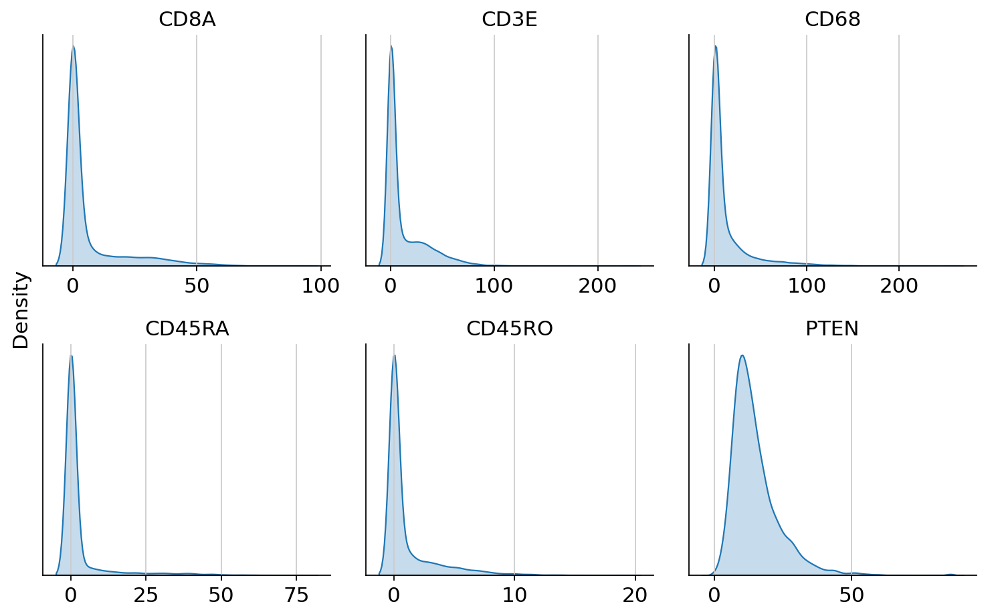

In [9]:
cytovi.plot_histogram(adata_protein, marker=["CD8A", "CD3E", "CD68", "CD45RA", "CD45RO", "PTEN"])

We can observe that markers show large dynamic ranges, which we can compress using the arcsinh tranformation. Furthermore, we can observe that expression scales can differ strongly across markers. Therefore, we also apply feature-wise min-max scaling.

In [10]:
# make layer dense for compatibility with cytovi functions
adata_protein.layers["raw"] = adata_protein.layers["raw"].toarray()

# apply arcsinh transformation and min-max scaling
cytovi.transform_arcsinh(adata_protein)
cytovi.scale(adata_protein)

# make layer sparse
adata_protein.layers["scaled"] = sp.csr_matrix(adata_protein.layers["scaled"])

We can now inspect the transformed and scaled protein expression.

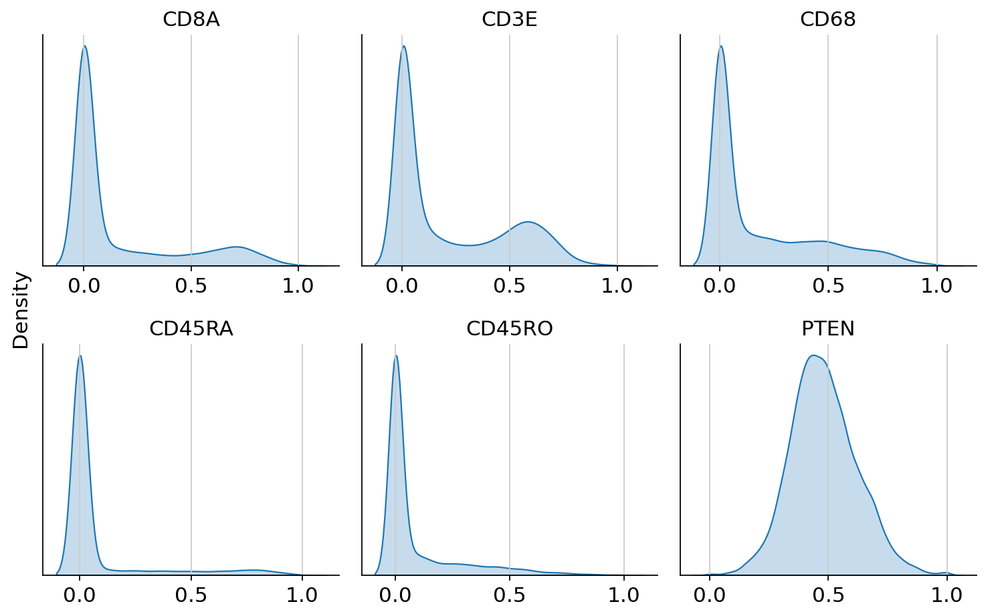

In [11]:
cytovi.plot_histogram(
    adata_protein, layer_key="scaled", marker=["CD8A", "CD3E", "CD68", "CD45RA", "CD45RO", "PTEN"]
)

## Preparing a guidance graph

After loading and preprocessing the data, we proceed to prepare a guidance graph. DiagVI supports three ways to specify the guidance graph, which are described in [DiagVI's user guide](https://docs.scvi-tools.org/en/stable/user_guide/models/diagvi.html#practical-guidance).

In this tutorial, we create a guidance graph via a custom mapping. We define a map that links protein names in `adata_protein.var_names` to gene names in `adata_rna.var_names` for overlapping features (i.e., proteins and their corresponding genes). Since protein and gene naming conventions often differ (e.g., a gene may be named MS4A1 while the corresponding protein is named CD20), automatic graph construction is not possible in this case. To construct the guidance graph, we use `DIAGVI.construct_custom_guidance_graph()`.

In [12]:
input_dict = {"rna": adata_rna, "protein": adata_protein}

In [13]:
gene_protein_map = {
    "CD4": "CD4",
    "MS4A1": "CD20",
    "CD8A": "CD8A",
    "CD3E": "CD3E",
    "SDC1": "CD138",
    "HLA-DRA": "HLA-DR",
    "ITGAX": "CD11c",
    "CD68": "CD68",
    "FCGR3A": "CD16",
    "GZMB": "GranzymeB",
    "CD163": "CD163",
    "PDCD1": "PD-1",
    "VSIR": "VISTA",
    "CD274": "PD-L1",
    "LAG3": "LAG-3",
    "CD45RA": "CD45RA",
    "PCNA": "PCNA",
    "CD45RO": "CD45RO",
    "MKI67": "Ki-67",
    "CTNNB1": "Beta-catenin",
    "PECAM1": "CD31",
    "PTEN": "PTEN",
    "KRT8": "PanCK",
    "KRT18": "PanCK",
    "KRT7": "PanCK",
    "KRT5": "PanCK",
    "KRT6A": "PanCK",
}

```{note}
Column names in the mapping DataFrame must match names in `input_dict`!
```

In [14]:
correspondence = pd.DataFrame(gene_protein_map.items(), columns=["rna", "protein"])
correspondence.head()

,rna,protein
0,CD4,CD4
1,MS4A1,CD20
2,CD8A,CD8A
3,CD3E,CD3E
4,SDC1,CD138


In [15]:
guidance_graph = DIAGVI.construct_custom_guidance_graph(input_dict, correspondence)

## Integrating the data with DiagVI

After loading and preprocessing the data, and after preparing the guidance graph, we can proceed with integrating the data using DiagVI. Running DiagVI involves three main steps: registering the AnnData objects, creating a DIAGVI model instance, and training the model.

During registration, we can specify modality-specific parameters that influence how DiagVI processes each dataset. For example, we can define which data layers to use and indicate where batch annotations are stored. We can also configure whether to run DiagVI in a semi-supervised setting by providing cell type labels if available, and whether to use a simple Gaussian prior or a more flexible Gaussian mixture model (GMM) with $L$ components as the prior on the cell latent variables. When cell type labels are provided, $L$ is set to the number of unique labels.

Another important parameter is `likelihood`, which determines the generative likelihood used for each modality. For count data such as scRNA-seq, we recommend using the negative binomial likelihood (`"nb"`). For transformed and scaled protein intensities, we recommend using the normal likelihood (`"normal"`). In the latter case, `normalize_lib=False` must also be set to prevent DiagVI from applying library size normalization to protein intensities. For more details on likelihood choices and library size normalization, see [DiagVI's user guide](https://docs.scvi-tools.org/en/stable/user_guide/models/diagvi.html).

In this tutorial, we model raw gene counts using a negative binomial likelihood and transformed, scaled protein intensities using a normal likelihood. For the RNA modality, we additionally provide cell type labels, enabling the training of a classifier that predicts cell types from the latent embeddings. To mimic a realistic label transfer scenario where annotations are available for scRNA-seq data but not for spatial proteomics data, we do not provide labels for the protein modality. By `setting gmm_prior=True`, we further enable a Gaussian mixture prior for both modalities. We register each AnnData object separately, however, setting up MuData objects is also possible using `DIAGVI.setup_mudata()`.

In [16]:
DIAGVI.setup_anndata(
    adata_rna,
    layer="counts",
    labels_key="annotation_l2",
    likelihood="nb",
    gmm_prior=True,
)

DIAGVI.setup_anndata(
    adata_protein,
    layer="scaled",
    likelihood="normal",
    normalize_lib=False,
    gmm_prior=True,
)

To initialize the DiagVI model, we provide the input dictionary mapping modality names to their corresponding AnnData objects, together with the guidance graph. The input dictionary was defined earlier during guidance graph preparation. Alternatively, the model can be initialized directly from a MuData object.

Because DiagVI can be applied to a wide range of integration tasks, there is no single latent dimensionality that is optimal in all cases. We therefore explicitly set a non-default value for the latent dimension. Based on our observations, latent space dimensions in the range of 10 to 20 typically yield strong performance in terms of modality alignment and biological conservation when integrating scRNA-seq data with spatial proteomics data. Similar findings were reported by Ingelfinger et al. (2025, [bioRxiv](https://www.biorxiv.org/content/10.1101/2025.09.07.674699v1)). We therefore recommend choosing a latent dimension between 10 and 20 based on the number of profiled protein markers.

In [17]:
model = DIAGVI(
    adatas=input_dict,
    guidance_graph=guidance_graph,
    n_latent=20,
)

INFO     Guidance graph consistency checks passed.                                                                 


2026-07-13 11:53:00 | [INFO] Guidance graph consistency checks passed.


INFO     DiagVI Model with the following params: input names: ['rna', 'protein'], n_inputs: {'rna': 405, 'protein':
         23}, n_batches: {'rna': 1, 'protein': 1}, n_labels: {'rna': 13, 'protein': 1}, semi_supervised: {'rna':   
         True, 'protein': False}, gmm_priors: {'rna': True, 'protein': True}, generative distributions: {'rna':    
         'nb', 'protein': 'normal'}, n_latent: 20.                                                                 


2026-07-13 11:53:00 | [INFO] DiagVI Model with the following params: input names: ['rna', 'protein'], n_inputs: {'rna': 405, 'protein': 23}, n_batches: {'rna': 1, 'protein': 1}, n_labels: {'rna': 13, 'protein': 1}, semi_supervised: {'rna': True, 'protein': False}, gmm_priors: {'rna': True, 'protein': True}, generative distributions: {'rna': 'nb', 'protein': 'normal'}, n_latent: 20.


We can now train DiagVI, which typically completes within a few minutes on a GPU. While the default hyperparameters provide a solid starting point, optimal performance often benefits from tuning. For more information on hyperparameters and tuning, see [DiagVI's user guide](https://docs.scvi-tools.org/en/stable/user_guide/models/diagvi.html#practical-guidance). For this larger dataset, we additionally set a non-default `batch_size` to accelerate training.

In [18]:
model.train(max_epochs=50, batch_size=2048)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
You are using a CUDA device ('NVIDIA RTX 6000 Ada Generation') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 10 records. Best score: 30.918. Signaling Trainer to stop.


We can check model convergence by plotting training and validation losses over epochs.

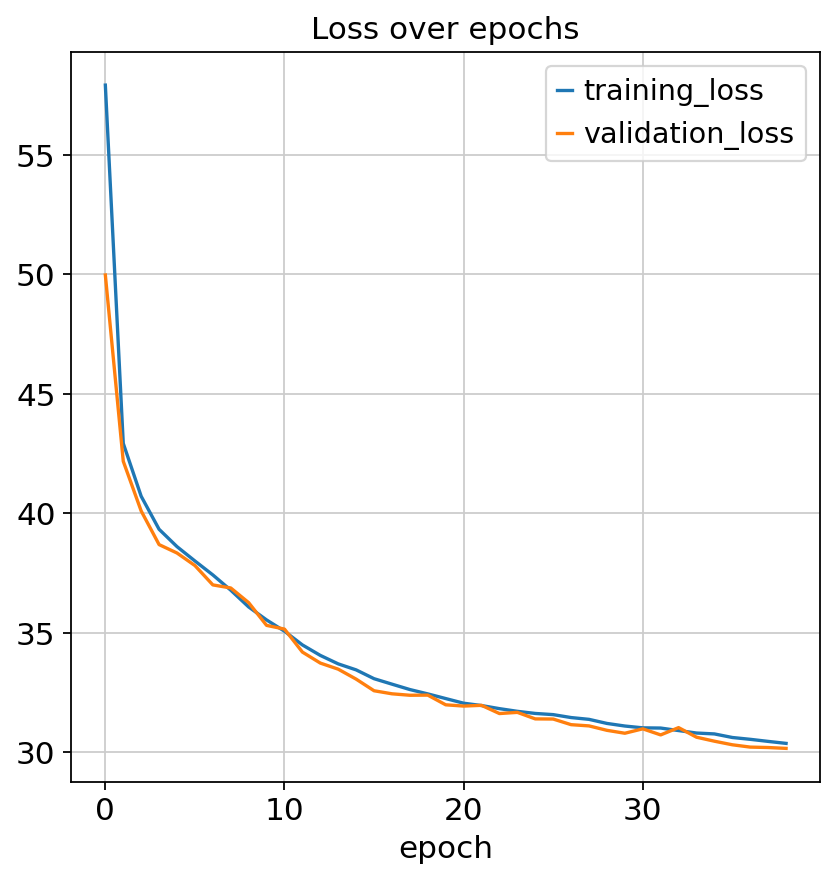

In [19]:
fig, ax = plt.subplots(1, 1)
model.history["training_loss"].plot(ax=ax, label="train")
model.history["validation_loss"].plot(ax=ax, label="validation")
ax.set(title="Loss over epochs")
ax.legend()

Once training is complete, we can extract the learned latent representations for each cell.

In [20]:
DIAGVI_LATENT_KEY = "X_diagvi"
latents = model.get_latent_representation()

adata_rna.obsm[DIAGVI_LATENT_KEY] = latents["rna"]
adata_protein.obsm[DIAGVI_LATENT_KEY] = latents["protein"]

## Evaluating the results

### Integrating the data with PCA and CCA

To evaluate the learned embeddings, we construct joint PCA and CCA baselines using [CellMapper](https://cellmapper.readthedocs.io/), a toolkit for cross-modal cell mapping and evaluation. CellMapper provides a fast re-implementation of [Seurat](https://github.com/satijalab/seurat)'s CCA aproach. While the results are not numerically identical to Seurat's implementation, the method is orders of magnitude faster and well suited for large datasets.

We first subset both modalities to overlapping features (genes and corresponding proteins), preprocess and scale each modality, and then compute 20-dimensional joint PCA and CCA embeddings. Finally, we concatenate the two AnnData objects for downstream evaluation and visualization.

```{note}
If your goal is only to visualize DiagVI’s learned latent embeddings on your own data, you can simply concatenate the AnnData objects containing the latent embeddings. You do not need to select overlapping features or preprocess them as shown in the next three code cells, which are only required for computing baseline embeddings.
```

In [21]:
# extract mapping
rna_genes = list(gene_protein_map.keys())
protein_markers = list(gene_protein_map.values())

# subset AnnDatas to overlapping features
adata_rna_sub = adata_rna[:, rna_genes].copy()
adata_protein_sub = adata_protein[:, protein_markers].copy()
adata_protein_sub.var_names = rna_genes

# RNA preprocessing
adata_rna_sub.X = adata_rna_sub.layers["counts"].copy()
sc.pp.normalize_total(adata_rna_sub)
sc.pp.log1p(adata_rna_sub)
sc.pp.scale(adata_rna_sub)

# protein preprocessing
cytovi.scale(adata_protein_sub, method="standard")
adata_protein_sub.X = adata_protein_sub.layers["scaled"].copy()

In [22]:
cmap = CellMapper(query=adata_protein_sub, reference=adata_rna_sub)

PCA_LATENT_KEY = "X_joint_pca"
CCA_LATENT_KEY = "X_cca"
cmap.compute_joint_pca(n_comps=20, key_added=PCA_LATENT_KEY)
cmap.compute_fast_cca(n_comps=20, key_added=CCA_LATENT_KEY)

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Embedding computed with method 'joint_pca' stored as 'X_joint_pca' in both reference.obsm and query.obsm. 
INFO     Computing fast CCA between query (395161 cells) and reference (395161 cells).                             
INFO     Using 27 common genes between query and reference datasets.                                               
INFO     SVD of cross-covariance matrix computed successfully.                                                     
INFO     Embedding computed with method 'fast_cca' stored as 'X_cca' in both reference.obsm and query.obsm.        


#### Integrating the data with scVI and scANVI

We further compare DiagVI to another semi-supervised model, [scANVI](https://docs.scvi-tools.org/en/stable/user_guide/models/scanvi.html). Since scANVI is built on top of [scVI](https://docs.scvi-tools.org/en/stable/user_guide/models/scvi.html), we also include scVI as an additional baseline.

Both models require non-negative input values and are primarily designed for count-based RNA data, rather than cross-modal integration tasks such as the one considered here. Nevertheless, we include them as reference methods to assess how well general-purpose single-modality models perform in this setting.

To apply scVI and scANVI, we restrict the data to overlapping features and preprocess it using normalization and transformation steps that preserve non-negativity (i.e., no centering during scaling). We then set the `gene_likelihood="normal"` parameter in scVI to accommodate the transformed input data.

In [23]:
# RNA preprocessing for scVI and scANVI
adata_rna_sub.X = adata_rna_sub.layers["counts"].copy()
sc.pp.normalize_total(adata_rna_sub, target_sum=1e4)
sc.pp.log1p(adata_rna_sub)
sc.pp.scale(adata_rna_sub, zero_center=False)

# protein preprocessing for scVI and scANVI
adata_protein_sub.X = adata_protein_sub.layers["transformed"].copy()
sc.pp.scale(adata_protein_sub, zero_center=False)

In [24]:
# create combined AnnData object containing only overlapping features
adata_combined = sc.concat(
    [adata_rna_sub, adata_protein_sub],
    axis=0,
    join="inner",
    label="modality",
    keys=["rna", "protein"],
)
adata_combined.uns["annotation_l1_colors"] = adata_rna_sub.uns["annotation_l1_colors"]
adata_combined.uns["annotation_l2_colors"] = adata_rna_sub.uns["annotation_l2_colors"]

We can now train scVI and extract its latent embeddings. To ensure a fair comparison, we use the same key configuration settings as for DiagVI, including the latent dimensionality, early stopping criteria, and batch size.

In [25]:
scvi.model.SCVI.setup_anndata(adata_combined, batch_key="modality")
scvi_model = scvi.model.SCVI(adata_combined, n_latent=20, gene_likelihood="normal")
scvi_model.train(
    max_epochs=50,
    batch_size=2048,
    train_size=0.9,
    early_stopping=True,
    early_stopping_monitor="validation_loss",
    early_stopping_min_delta=1,
    early_stopping_patience=10,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 10 records. Best score: -19.250. Signaling Trainer to stop.


In [26]:
SCVI_LATENT_KEY = "X_scVI"
adata_combined.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation()

After training scVI, we initialize and train scANVI based on the fitted scVI model. For a fair comparison with DiagVI, we provide cell type labels for the RNA modality and mask the labels for the protein modality, mimicking the same semi-supervised label transfer scenario.

In [27]:
# copy original labels
adata_combined.obs["annotation_scanvi"] = adata_combined.obs["annotation_l2"].copy()

# add Unknown category
adata_combined.obs["annotation_scanvi"] = adata_combined.obs[
    "annotation_scanvi"
].cat.add_categories(["Unknown"])

# assign to protein cells
adata_combined.obs.loc[adata_combined.obs["modality"] == "protein", "annotation_scanvi"] = (
    "Unknown"
)

In [28]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata_combined,
    labels_key="annotation_scanvi",
    unlabeled_category="Unknown",
)
scanvi_model.train(max_epochs=15, batch_size=2048)

INFO     Training for 15 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/15 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


In [29]:
SCANVI_LATENT_KEY = "X_scANVI"
adata_combined.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation()

### Qualitative evaluation

```{note}
Due to the large size of the dataset used in this tutorial, we rely on `rapids_singlecell` to ensure that computationally intensive steps in the qualitative evaluation run in a reasonable amount of time. Without GPU acceleration, steps such as neighborhood graph construction would be very slow. Importantly, DiagVI itself does not depend on `rapids_singlecell`. If `rapids_singlecell` is not available, the qualitative evaluation will be skipped, while all other steps can still be executed.
```

We can now visualize the cellular representations of the two baseline embeddings, scVI, scANVI, and DiagVI using UMAP to assess how well the two modalities align and whether biologically meaningful structure is preserved in the shared latent space.

... storing 'cell_id' as categorical


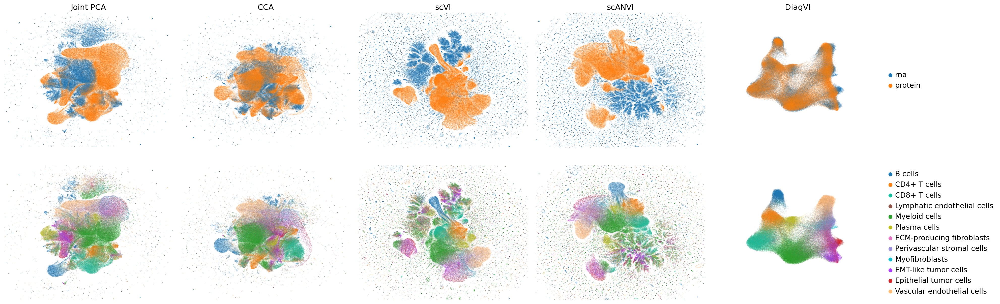

In [30]:
if HAS_RSC:
    # run qualitative evaluation only if rapids_singlecell is available

    embedding_keys = {
        "Joint PCA": (PCA_LATENT_KEY, "X_umap_joint_pca"),
        "CCA": (CCA_LATENT_KEY, "X_umap_cca"),
        "scVI": (SCVI_LATENT_KEY, "X_umap_scvi"),
        "scANVI": (SCANVI_LATENT_KEY, "X_umap_scanvi"),
        "DiagVI": (DIAGVI_LATENT_KEY, "X_umap_diagvi"),
    }

    for _, (latent_key, umap_key) in embedding_keys.items():
        rsc.pp.neighbors(adata_combined, use_rep=latent_key, metric="cosine")
        rsc.tl.umap(adata_combined, key_added=umap_key)

    colors = ["modality", "annotation_l2"]
    n_methods = len(embedding_keys)
    n_colors = len(colors)

    fig, axes = plt.subplots(n_colors, n_methods, figsize=(5 * n_methods, 4 * n_colors))
    method_names = list(embedding_keys.keys())

    for col, (method_name, (_, umap_key)) in enumerate(embedding_keys.items()):
        for row, color in enumerate(colors):
            ax = axes[row, col]

            legend_loc = "right margin" if col == n_methods - 1 else None

            sc.pl.embedding(
                adata_combined,
                basis=umap_key,
                color=color,
                ax=ax,
                show=False,
                title=method_name if row == 0 else "",
                legend_loc=legend_loc,
            )
            ax.set_xlim(-20, 20)
            ax.set_ylim(-20, 20)

    plt.tight_layout()
    plt.show()

The latent embeddings from both modalities are well aligned in DiagVI’s latent space, but neither in the joint PCA or CCA embeddings nor in scVI's or scANVI's latent spaces, where strong outliers and artefacts required cropping the plots for better visualization. Cell types, particularly immune populations, form coherent and well-defined clusters across modalities in DiagVI’s latent space. Some cell types, such as tumor and stromal subpopulations, are not clearly separable, reflecting substantial transcriptional and proteomic similarity between these states in our data. Indeed, these subpopulations were difficult to distinguish during annotation. In contrast, the other embeddings show only little clustering of protein cells and no clear clustering of RNA cells.

For the protein modality, clusters in DiagVI's latent space appear less distinct compared to the RNA modality. This is expected, as only 23 proteins are measured, capturing substantially less cellular heterogeneity than the more than 400 genes profiled in the RNA modality.

### Quantitative evaluation

In addition to visual inspection, we can quantitatively evaluate the embeddings using the FOSCTTM metric and the [scIB-metrics](https://scib-metrics.readthedocs.io/en/stable/) benchmarking framework.

FOSCTTM measures how close truly paired cells are in the shared embedding space. Lower values indicate better alignment, as correctly paired cells rank closer to each other among all possible cross-modal matches. To assess DiagVI’s generalizability, we restrict the evaluation to the cells held out for validation during training and compute the metric on this subset for all embeddings.

In [31]:
validation_indices = model.validation_indices

In [32]:
mask_rna = adata_combined.obs["modality"] == "rna"
mask_protein = adata_combined.obs["modality"] == "protein"

results = {}
for name, key in [
    ("pca", PCA_LATENT_KEY),
    ("cca", CCA_LATENT_KEY),
    ("scvi", SCVI_LATENT_KEY),
    ("scvanvi", SCANVI_LATENT_KEY),
    ("diagvi", DIAGVI_LATENT_KEY),
]:
    embeddings = {
        "rna": adata_combined.obsm[key][mask_rna.values],
        "protein": adata_combined.obsm[key][mask_protein.values],
    }
    results[f"foscttm_{name}"] = compute_foscttm(embeddings, validation_indices, downsample=True)

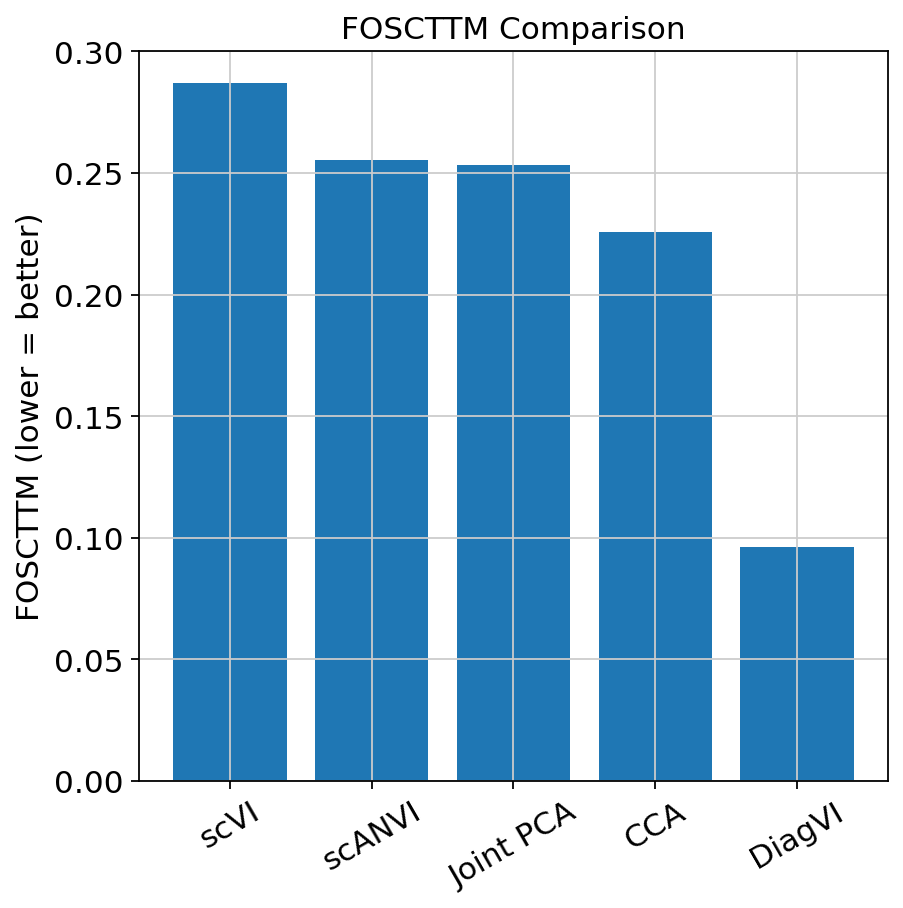

In [33]:
methods = ["Joint PCA", "CCA", "scVI", "scANVI", "DiagVI"]
scores = [
    results["foscttm_pca"]["foscttm/mean"],
    results["foscttm_cca"]["foscttm/mean"],
    results["foscttm_scvi"]["foscttm/mean"],
    results["foscttm_scvanvi"]["foscttm/mean"],
    results["foscttm_diagvi"]["foscttm/mean"],
]

order = np.argsort(scores)[::-1]
methods_sorted = [methods[i] for i in order]
scores_sorted = [scores[i] for i in order]

plt.figure()
plt.bar(methods_sorted, scores_sorted)
plt.ylabel("FOSCTTM (lower = better)")
plt.title("FOSCTTM Comparison")
plt.ylim(0, 0.3)
plt.xticks(rotation=30)
plt.show()

The FOSCTTM results show that DiagVI achieves substantially better alignment of paired cells compared to the baselines, indicating that truly paired cells are much closer in the shared latent space.

To further evaluate the integration performance, we use the [scIB-metrics](https://scib-metrics.readthedocs.io/en/stable/) package, which provides a comprehensive set of metrics to assess how well embeddings remove batch effects (or, in our case, align modalities) while preserving biologically meaningful structure.

Given the large size of our dataset, we first subsample the data to 20,000 cells per modality using `cytovi.subsample()`. This substantially reduces runtime while still providing a reliable estimate of integration quality.

In [34]:
adata_combined.obs_names_make_unique()
adata_combined_sub = cytovi.subsample(adata_combined, n_obs=10000, groupby="modality")

We exclude the PCR comparison metric from the benchmark. This metric quantifies how much batch variance is removed relative to an unintegrated baseline, which is well-defined for single-modality batch correction (where all cells share the same feature space) but not for multi-modal integration with non-overlapping features. The remaining batch correction metrics, alongside the FOSCTTM metric, still provide a comprehensive evaluation of modality alignment.

In [35]:
batchcors = BatchCorrection(pcr_comparison=False)

bm = Benchmarker(
    adata_combined_sub,
    batch_key="modality",
    label_key="annotation_l2",
    embedding_obsm_keys=[
        PCA_LATENT_KEY,
        CCA_LATENT_KEY,
        SCVI_LATENT_KEY,
        SCANVI_LATENT_KEY,
        DIAGVI_LATENT_KEY,
    ],
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=batchcors,
    progress_bar=False,
    n_jobs=-1,
)
bm.benchmark()

2026-07-13 12:01:36 | [INFO] isolated labels: no more than 2 batches per label
INFO:2026-07-13 12:01:37,111:jax._src.xla_bridge:834: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2026-07-13 12:01:37 | [INFO] Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2026-07-13 12:02:17 | [INFO] isolated labels: no more than 2 batches per label
2026-07-13 12:02:46 | [INFO] isolated labels: no more than 2 batches per label
2026-07-13 12:03:06 | [INFO] isolated labels: no more than 2 batches per label
2026-07-13 12:03:25 | [INFO] isolated labels: no more than 2 batches per label


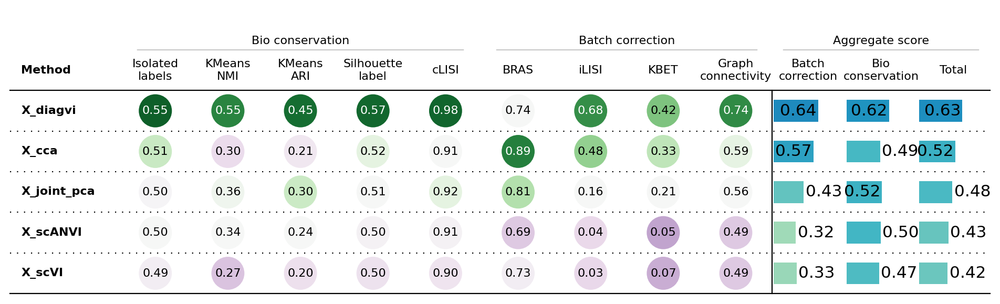

In [36]:
bm.plot_results_table(min_max_scale=False)

The scIB results show that DiagVI outperforms the PCA and CCA baselines as well as scVI and scANVI in both modality alignment and biological conservation. This indicates that RNA and protein cells mix well in the latent space and that biological structure is preserved. Overall, DiagVI provides the best balance between aligning modalities and maintaining biological signal.

We emphasize again that neither scVI nor scANVI were designed for this type of cross-modal integration and are included here as general-purpose and semi-supervised baselines. Dedicated methods for diagonal data integration exist (e.g., [MaxFuse](https://www.nature.com/articles/s41587-023-01943-0)). A comprehensive benchmark comparing DiagVI to such methods will be included in a future publication.

## Transfering cell type labels

DiagVI’s latent embeddings can be used to transfer cell type labels from scRNA-seq to spatial proteomics data. scRNA-seq captures high cellular heterogeneity across many features, while spatial proteomics provides high spatial resolution. By mapping the protein cells into DiagVI’s shared latent space, we can transfer the more confident RNA annotations to the protein modality. For this, we again use [CellMapper](https://cellmapper.readthedocs.io/).

In [37]:
if HAS_RSC:
    knn_method = "rapids"
else:
    knn_method = "pynndescent"

In [38]:
cmap = CellMapper(adata_protein, adata_rna)
cmap.map("annotation_l2", use_rep=DIAGVI_LATENT_KEY, knn_method=knn_method)
cmap.evaluate_label_transfer("annotation_l2")

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Using rapids to compute 30 neighbors.                                                                     
INFO     Computing mapping matrix using kernel method 'gauss'.                                                     
WARNING  Square matrix detected but is_self_mapping=False. Consider setting is_self_mapping=True for matrix powers.
INFO     Mapping categorical data for key 'annotation_l2' using direct multiplication.                             
INFO     Categorical data mapped and stored in query.obs['annotation_l2_pred'].                                    
INFO     Accuracy: 0.6288, Precision: 0.6328, Recall: 0.6288, Weighted F1-Score: 0.6297, Macro F1-Score: 0.5077,   
         Excluded Fraction: 0.0000                                                                                 


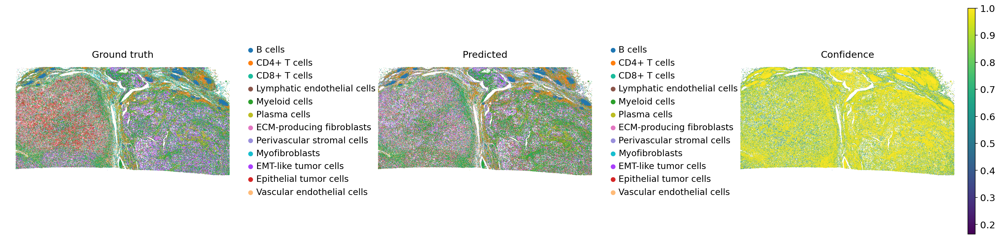

In [39]:
sc.pl.spatial(
    adata_protein,
    spot_size=2,
    color=["annotation_l2", "annotation_l2_pred", "annotation_l2_conf"],
    title=["Ground truth", "Predicted", "Confidence"],
    ncols=3,
    size=10,
    wspace=0.4,
)

Comparing the ground truth and predicted labels, DiagVI effectively recapitulates the overall tissue structure. Immune cell populations are well-defined and coherent in the predictions, closely matching the ground truth. EMT-like and epithelial tumor cells, for instance, are not clearly separated, consistent with their overlap in DiagVI’s latent space.

Because DiagVI cannot clearly distinguish tumor and stromal subpopulations due to their transcriptional and proteomic similarity, we also perform label transfer at a higher hierarchical level, grouping these subpopulations together.

In [40]:
cmap = CellMapper(adata_protein, adata_rna)
cmap.map("annotation_l1", use_rep=DIAGVI_LATENT_KEY, knn_method=knn_method)
cmap.evaluate_label_transfer("annotation_l1")

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Using rapids to compute 30 neighbors.                                                                     
INFO     Computing mapping matrix using kernel method 'gauss'.                                                     
WARNING  Square matrix detected but is_self_mapping=False. Consider setting is_self_mapping=True for matrix powers.
INFO     Mapping categorical data for key 'annotation_l1' using direct multiplication.                             
INFO     Categorical data mapped and stored in query.obs['annotation_l1_pred'].                                    
INFO     Accuracy: 0.7057, Precision: 0.7079, Recall: 0.7057, Weighted F1-Score: 0.7055, Macro F1-Score: 0.6557,   
         Excluded Fraction: 0.0000                                                                                 


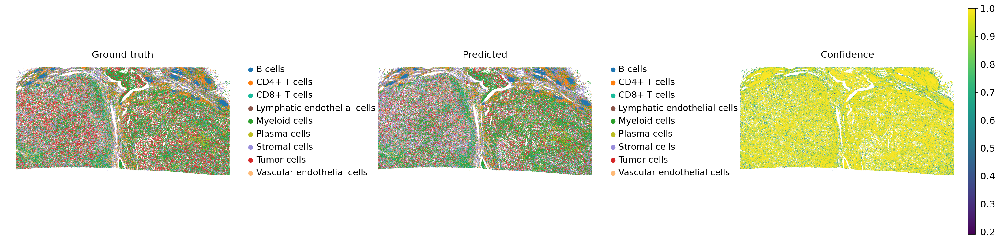

In [41]:
sc.pl.spatial(
    adata_protein,
    spot_size=2,
    color=["annotation_l1", "annotation_l1_pred", "annotation_l1_conf"],
    title=["Ground truth", "Predicted", "Confidence"],
    ncols=3,
    size=10,
    wspace=0.4,
)

We can now see improved label transfer performance at this higher hierarchical level, reflecting that the confidence in transferred cell labels aligns with the quality and reliability of the original cell type annotations.